### Рынок заведений общественного питания Москвы

Описание:
- Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Цель:
- Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Данные:
- Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Описание данных:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона:
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки)
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

План:
- Предобработка
- Общее исследование
- Исследование кофеен

#### Шаг 1. Загрузка данных и изучение общей информации

In [1]:
! pip install squarify


[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
from dataclasses import dataclass
from datetime import datetime
from dotenv import load_dotenv
from http import HTTPStatus
from folium import Choropleth, Map, Marker
from folium.features import CustomIcon
from folium.plugins import MarkerCluster
import json
import logging
from math import sqrt
import matplotlib.pyplot as plt
import numpy as np
import os.path
import pandas as pd
from pandas.plotting import register_matplotlib_converters
import plotly.express as px
import plotly.graph_objs as go
import re
import requests
from scipy import stats as sst
import seaborn as sns
import squarify
import statsmodels.api as sm
import sys
from typing import Optional, Union
import warnings

# настроимся на приятный вечер
register_matplotlib_converters()
warnings.filterwarnings('ignore')

load_dotenv()

logging.basicConfig(
    format='%(asctime)s - %(levelname)s - %(message)s',
    level=logging.INFO)


# будем следить за поведением программы и за пользователями
# с помощью кастомного исключения на все случаи жизни
class BaseException(Exception):
    """Напишем базовое исключение"""

    def __init__(self, text):
        """активация..."""
        self.text = text

In [3]:
DEBUG = False

PATH_ERROR_TEXT = 'некоррекнто прописан путь к данным'
def read_file(path_1: str, path_2: str, sep: str = ',') -> pd.DataFrame:
    """
    Функция считывает данные из файла и
    возвращает дата фрейм
    """
    # проверим, что файл существует, также стоит проверить
    # что это именно файл, если это не так, то нет смысла продолжать
    if (os.path.exists(path_1) and os.path.isfile(path_1)) or requests.get(path_1).status_code == HTTPStatus.OK:
        logging.info('works online')
        data = pd.read_csv(path_1, sep=sep)
        logging.info('read file sucsess')
        return data
    elif os.path.exists(path_2) and os.path.isfile(path_2):
        logging.info('works lokaly')
        data = pd.read_csv(path_2, sep=sep)
        logging.info('read file sucsess')
        return data
    else:
        logging.critical(PATH_ERROR_TEXT)
        raise BaseException(PATH_ERROR_TEXT) and sys.exit()


def get_full_information(data: pd.DataFrame) -> None:
    """
    Функция дает нам полное
    представление о данных
    """
    logging.info('первое представление о данных')
    for _ in [data.head(), data.describe()]:
        display(_)
        print("*"*100)
    data.info()
    data.hist(figsize=(15, 10))
    plt.show();


def check_names_columns(data: pd.DataFrame) -> list[str]:
    """
    Функция проверяет, соответствуют
    ли имена колонок snake_style
    """
    columns_to_change = []
    pattern = r"^[a-z]+(_[a-z]+)*$"
    for column in data.columns:
        match = re.match(pattern, column)
        if match:
            continue
        else:
            columns_to_change.append(column)
    logging.info('изменим название колонок:')
    logging.info(columns_to_change)
    return columns_to_change


def test_check_names_columns():
    # Тестовый датафрейм с корректными именами колонок
    df1 = pd.DataFrame({'first_name': ['John', 'Jane'], 'last_name': ['Doe', 'Smith']})
    assert check_names_columns(df1) == []

    # Тестовый датафрейм с некорректными именами колонок
    df2 = pd.DataFrame({'FirstName': ['John', 'Jane'], 'last name': ['Doe', 'Smith']})
    assert check_names_columns(df2) == ['FirstName', 'last name']

    # Тестовый датафрейм с пустыми данными
    df3 = pd.DataFrame()
    assert check_names_columns(df3) == []

    # Тестовый датафрейм с одной колонкой
    df4 = pd.DataFrame({'name': ['John', 'Jane']})
    assert check_names_columns(df4) == []

    # Тестовый датафрейм с двумя колонками, одна из которых корректная
    df5 = pd.DataFrame({'first_name': ['John', 'Jane'], 'last name': ['Doe', 'Smith']})
    assert check_names_columns(df5) == ['last name']
    print('OK')


NOT_LIST = 'входные данные должны быть в форме списка'
NOT_STR = 'в списке должны быть строки'
def change_name_columns(columns_to_change: list[str]) -> dict[str, str]:
    """
    Функция возвращает словарь,
    ключ- неправильное название колонки
    значение - верное
    """
    def sup_right_name(column:str) ->str:
        cont: list[str] = list(column)
        new_name: str = ''
        while cont:
            char = cont.pop()
            if len(cont) == 0:
                new_name = char.lower() + new_name
            elif char.isupper():
                new_name = f'_{char.lower()}' + new_name
            else:
                new_name = char + new_name
        return new_name
    right_names = []
    # проверим, что нам подсунули на входе,
    # это нужно, для обеспечения устойчивости программы
    if not isinstance(columns_to_change, list):
        raise BaseException(NOT_LIST)
    for column in columns_to_change:
        if not isinstance(column, str):
            raise BaseException(NOT_STR)
    else:
        for column in columns_to_change:
            if len(column.split()) != 1:
                column = '_'.join(column.split())
                column = column.lower()
            elif column.isupper():
                column = column.lower()
            elif re.match(r'^[a-zA-Z]+$', column):
                column = sup_right_name(column)
            right_names.append(column)
    columns = {c:r for c,r in zip(columns_to_change, right_names)}
    return columns


def test_change_name_columns():
    # Тестовый список с корректными названиями колонок
    columns1 = ['first_name', 'last_name']
    assert change_name_columns(columns1) == {'first_name': 'first_name', 'last_name': 'last_name'}

    # Тестовый список с некорректными данными - не список
    columns2 = 'first_name, last_name'
    try:
        change_name_columns(columns2)
    except BaseException as e:
        assert str(e) == 'входные данные должны быть в форме списка'

    # Тестовый список с некорректными данными - не строки
    columns3 = ['first_name', 123]
    try:
        change_name_columns(columns3)
    except BaseException as e:
        assert str(e) == 'в списке должны быть строки'

    # Тестовый список с некорректными названиями колонок
    columns4 = ['FirstName', 'last name']
    assert change_name_columns(columns4) == {'FirstName': 'first_name', 'last name': 'last_name'}

    # Тестовый список с одним элементом
    columns5 = ['name']
    assert change_name_columns(columns5) == {'name': 'name'}

    # Тестовый список с элементами, требующими преобразований
    columns6 = ['First name', 'LASTNAME', 'Age']
    assert change_name_columns(columns6) == {'First name': 'first_name', 'LASTNAME': 'lastname', 'Age': 'age'}
    print('OK')


def find_nan(data: pd.DataFrame) -> dict:
    """
    Функция считает по каждой колонке, сколько в ней пропусков,
    если пропусков 0, то с колонкой все хорошо
    и ее мы трогать не будем
    """
    return {column: data[column].isna().sum()/len(data)
            for column in data.columns
            if data[column].isna().sum() != 0}


def test_find_nan():
    # Тестовый датафрейм с пропусками
    df1 = pd.DataFrame({'A': [1, 2, None, 4], 'B': [None, 6, 7, 8], 'C': [9, 10, 11, None]})
    assert find_nan(df1) == {'A': 0.25, 'B': 0.25, 'C': 0.25}

    # Тестовый датафрейм без пропусков
    df2 = pd.DataFrame({'A': [1, 2, 3, 4], 'B': [5, 6, 7, 8], 'C': [9, 10, 11, 12]})
    assert find_nan(df2) == {}
    print('OK')


def drop_nan_less_five_percent(data: pd.DataFrame) -> pd.DataFrame:
    """
    Функция удаляет строки по колонкам,
    если кол-во пропусков в них составляло
    менее 5 процентов
    """
    columns_with_nan = find_nan(data)
    for column, percent in columns_with_nan.items():
        if percent < .05:
            data = data[data[column].notna()]
    return data


def test_drop_nan_less_five_percent():
    # Тестовый датафрейм с пропусками в колонке A (менее 5%)
    df1 = pd.DataFrame({'a': [None] + [i for i in range(20)], 'b': [i for i in range(21)]})
    assert drop_nan_less_five_percent(df1).equals(pd.DataFrame(data={'a': [float(i) for i in range(20)],
                                                                     'b':[i for i in range(1, 21)]},
                                                               index = [i for i in range(1,21)]))

    # Тестовый датафрейм с пропусками в колонках A и B (более 5%)
    df2 = pd.DataFrame({'A': [None, None, None, None], 'B': [None, None, None, None], 'C': [9, 10, 11, 12]})
    assert drop_nan_less_five_percent(df2).equals(df2)

    # Тестовый датафрейм без пропусков
    df3 = pd.DataFrame({'A': [1, 2, 3, 4], 'B': [5, 6, 7, 8], 'C': [9, 10, 11, 12]})
    assert drop_nan_less_five_percent(df3).equals(df3)
    print('OK')


def works_dupblicates(data: pd.DataFrame) -> pd.DataFrame:
    """
    Функция работает с дубликатами
    """
    # приведем значения колонок к нижнему регистру
    for column in data.columns:
        if data.dtypes[column] == 'object':
            data[column] = data[column].str.lower()
    # если появились дубликаты дропнем их
    if data.duplicated().sum() > 0:
        logging.info('нашли дубликаты и удалили их')
        privios_data = len(data)
        data = data.drop_duplicates()
        logging.info('потеря данных в %:')
        logging.info(round((1 - (len(data)/privios_data))*100, 2))
    else:
        logging.info('дубликатов не найдено')
    return data


def test_works_duplicates():
    df = pd.DataFrame({'name': ['Alice', 'Bob', 'Charlie', 'alice'],
                       'age': [25, 30, 35, 25],
                       'date': ['2020-01-01', '2020-02-02', '2020-03-03', '2020-01-01']})
    df_result = works_dupblicates(df)
    assert len(df_result) == 3
    assert not df_result.duplicated().any()
    print('ОК')


def change_type_to_date(data: pd.DataFrame) -> pd.DataFrame:
    """
    Меняет формат на время
    """
    pattern = r'\d{4}-\d{2}-\d{2}'
    for column in data.columns:
        match = re.match(pattern, str(data[column][0]))
        if match:
            data[column] = pd.to_datetime(data[column])
            logging.info('поменяли на временной формат колоку')
            logging.info(column)
    return data


def test_change_type_to_date():
    df = pd.DataFrame({'name': ['Alice', 'Bob', 'Charlie', 'alice'],
                       'age': [25, 30, 35, 40],
                       'date': ['2020-01-01', '2020-02-02', '2020-03-03', '2020-04-04']})
    df_result = change_type_to_date(df)
    assert isinstance(df_result['date'][0], pd.Timestamp)
    assert not isinstance(df_result['name'][0], pd.Timestamp)
    print('OK')


def testing():
    test_check_names_columns()
    test_change_name_columns()
    test_find_nan()
    test_drop_nan_less_five_percent()
    test_works_duplicates()
    test_change_type_to_date()


def process_data(path_1: str, path_2: str, sep: str)->pd.DataFrame:
    """
    Функция содержит основную логику
    первичной обработки данных
    """
    try:
        # читаем данные и выводим всю правду о них
        data = read_file(path_1, path_2, sep)
        get_full_information(data)

        # работаем с названиями колонок
        columns_to_change = check_names_columns(data)
        if len(columns_to_change) > 0:
            columns_with_correct_name = change_name_columns(columns_to_change)
            data = data.rename(columns=columns_with_correct_name)

        # поработаем с пропусками
        if len(find_nan(data)) > 0:
            data = drop_nan_less_five_percent(data)
            display(pd.DataFrame(data = {'columns': find_nan(data).keys(),
                                         'nan_percent': find_nan(data).values()}).style.background_gradient('coolwarm'))
        else:
            logging.info('пропусков не нашел')


        # уничтожаем дубликаты
        data = works_dupblicates(data)

        # приводим к нужным типам
        data = change_type_to_date(data)

        # фуххх, добрались до конца
        logging.info('выдыхай, бобер, первичная обработка данных окончена')
        return data

    # если были ошибки, не стоит их скрывать, скажем об этом прямо
    except BaseException as error_message:
        return(error_message)

if DEBUG:
    testing()

2024-05-01 19:38:31,465 - INFO - works online
2024-05-01 19:38:32,519 - INFO - read file sucsess
2024-05-01 19:38:32,521 - INFO - первое представление о данных


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


****************************************************************************************************


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


****************************************************************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int6

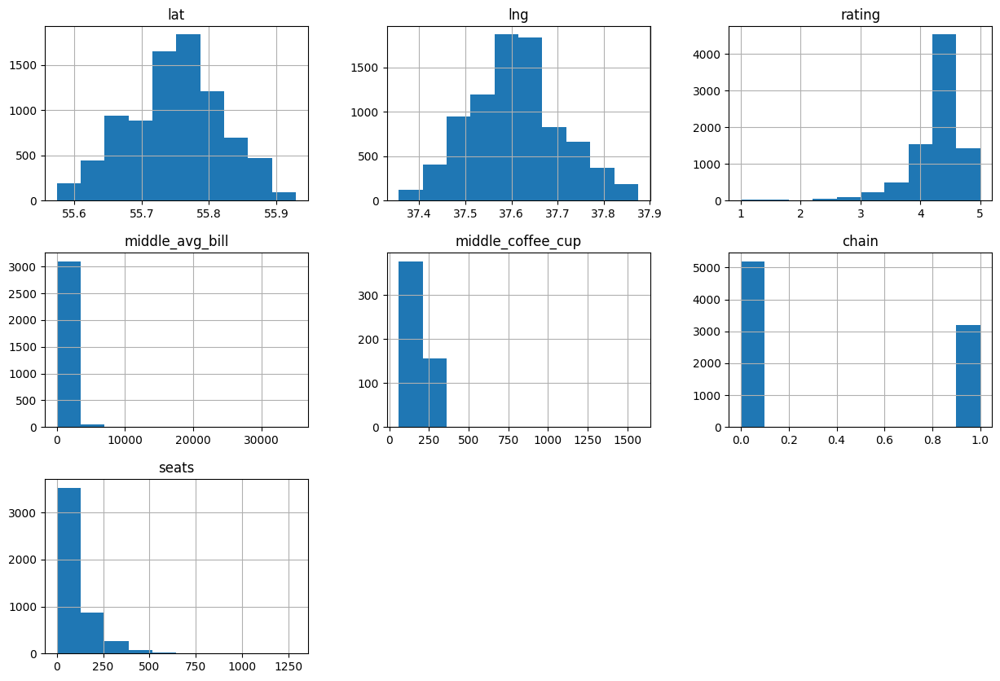

2024-05-01 19:38:34,585 - INFO - изменим название колонок:
2024-05-01 19:38:34,656 - INFO - []


,columns,nan_percent
0,hours,0.063764
1,price,0.605639
2,avg_bill,0.546039
3,middle_avg_bill,0.625387
4,middle_coffee_cup,0.936355
5,seats,0.429574


2024-05-01 19:38:34,885 - INFO - дубликатов не найдено
2024-05-01 19:38:34,886 - INFO - выдыхай, бобер, первичная обработка данных окончена


In [4]:
data = process_data(os.getenv('ca_mp', ''), 'moscow_places.csv', sep=',')
data['chain'] = data['chain'].astype(bool)

In [5]:
# Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?
def validate(data: pd.DataFrame, column:str) -> bool:
    return True if column in set(data.columns) else False

def make_first_research(data: pd.DataFrame) -> None:
    try:
        def count_unique_name(data: pd.DataFrame) -> int:
            if not validate(data, 'name'):
                raise ValueError('Column not exsists')
            return len(data['name'].unique())
        def analyse_column(data: pd.DataFrame) -> dict[str, str]:
            return {column : data[column].dtype for column in data.columns}
        print(f"{count_unique_name(data)} заведений представлено")
        for name, _type in analyse_column(data).items():
            print(f"в колонке {name}: тип данных - {_type}")
    except ValueError as message:
        print(message)

make_first_research(data)

5512 заведений представлено
в колонке name: тип данных - object
в колонке category: тип данных - object
в колонке address: тип данных - object
в колонке district: тип данных - object
в колонке hours: тип данных - object
в колонке lat: тип данных - float64
в колонке lng: тип данных - float64
в колонке rating: тип данных - float64
в колонке price: тип данных - object
в колонке avg_bill: тип данных - object
в колонке middle_avg_bill: тип данных - float64
в колонке middle_coffee_cup: тип данных - float64
в колонке chain: тип данных - bool
в колонке seats: тип данных - float64


#### Шаг 2. Предобработка данных

In [6]:
# Изучите, есть ли еще дубликаты в данных.
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(data.groupby('name').agg({'lat': 'nunique'}).sort_values(by='lat', ascending=False))

,lat
name,
кафе,188
шоколадница,120
домино'с пицца,77
додо пицца,74
one price coffee,72
яндекс лавка,69
cofix,65
prime,50
хинкальная,44


Явные неявные дубликаты не прослеживается, предполагаю было достаточно проверки на первом шаге

In [7]:
if sum(data.duplicated(subset=['name', 'address']))> 0:
    data.drop_duplicates(subset=['name', 'address'], inplace=True)
    print('done')

done


In [8]:
# Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?


def fill_missing_numerical_values(data: pd.DataFrame, column: str) -> None:
    """
    убираем числовые данные с пропусками
    на медианы отфильтрованные по категориям и регионам
    """
    if not validate(data, column):
        raise ValueError('column not found')
    for category in data['category'].unique():
        for district in data['district'].unique():
            median = data.loc[(data['category'] == category) & (data['district'] == district), column].median()
            data.loc[(data['category'] == category) & (data['district'] == district) & (data[column].isna()), column] = median


def vectorise(column: pd.Series) -> dict[str, int]:
    """Векторизуем столбец"""
    if not isinstance(column, pd.Series):
        raise TypeError('column must be pandas Series')
    return {value: _id for value, _id in zip(column.unique(), range(len(column.unique())))}


def reverse_vector(vector: dict[str, int]) -> dict[int, str]:
    """Меняем местами ключи и значения в словаре"""
    if not isinstance(vector, dict):
        raise TypeError('vector must be dict')
    return {value: key for key, value in vector.items()}


def fill_missing_categorical_values(data: pd.DataFrame, column: str, hz_value: Union[float, int, str, bool] = 'хз') -> None:
    """
    убираем категориальные данные с пропусками
    на медианы отфильтрованные по категориям и регионам
    """
    if not validate(data, column):
        raise ValueError('column not found')
    vector = vectorise(data[column])
    reversed_vector = reverse_vector(vector)
    data['vector'] = data[data[column].notna()][column].apply(lambda value: vector[value])
    for category in data['category'].unique():
        for district in data['district'].unique():
            mean = round(data.loc[(data['category'] == category) & (data['district'] == district), 'vector'].mean(), 0)
            if np.isnan(mean):
                data.loc[(data['category'] == category) & (data['district'] == district) & (data[column].isna()), column] = hz_value
            else:
                data.loc[(data['category'] == category) & (data['district'] == district) & (data[column].isna()), column] = reversed_vector[mean]
    data.drop(columns=['vector'], inplace=True)


if len(find_nan(data)) > 0:
            data = drop_nan_less_five_percent(data)
            display(pd.DataFrame(data = {'columns': find_nan(data).keys(),
                                         'nan_percent': find_nan(data).values()}).style.background_gradient('coolwarm'))
else:
    logging.info('хмм, устал, вроде все ок')

,columns,nan_percent
0,hours,0.063675
1,price,0.605451
2,avg_bill,0.545822
3,middle_avg_bill,0.625208
4,middle_coffee_cup,0.936325
5,seats,0.429660


Где возможно заполнили пропуски или поставили заглушки

In [9]:
# Создайте столбец street с названиями улиц из столбца с адресом.

data['street']: pd.Series = data['address'].apply(lambda x: 'ошибка заполнения адреса' 
                                                  if 'округ' in x.split(',')[1].strip() or 'район' in x.split(',')[1].strip() 
                                                  else x.split(',')[1].strip())

In [10]:
# Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

data['is_24/7']: pd.Series = data['hours'].str.contains('ежедневно, круглосуточно')

Создали новые признаки (добавили столбцы)

In [11]:
class BoxMath:
    """Parents math class for anomalies"""

    CONSTANT: Optional[Union[int, float]] = None

    def __init__(self, df: pd.DataFrame, column: str) -> None:
        """
        инициализация
        """
        self.df = df
        self.column = column
        if self.column  not in set(self.df.columns):
            raise ValueError('ошибка при формировании класса')
        if self.df[self.column].isna().sum() > 0:
            self.df = self.df[self.df[self.column].notna()]
            logging.info('были исключены пропуски')

    @property
    def metrics(self) -> dict[str: Union[int, float]]:
        """
        Рассчитываем показатели:
        необходмые для вычислений
        """
        pass

    @property
    def max_not_anomal(self) -> Union[int, float]:
        """
        Вычисляет верхнюю границу усов
        """
        pass

    @property
    def min_not_anomal(self) -> Union[int, float]:
        """
        Вычисляет нижнюю границу усов
        """
        pass

    def is_distribution_normal(self, alpha: float = 0.05)-> bool:
        """определяет нормальное ли распределение"""
        if sst.shapiro(self.df[self.column])[1] < alpha:
            return False 
        return True
    
    @property
    def anomalies(self) -> pd.Series:
        """
        аномальные значения
        """
        return (self.df[
                        (self.df[self.column] < self.min_not_anomal)
                          | 
                        (self.df[self.column] > self.max_not_anomal)
                        ][self.column])
    
    @property
    def anomalies_indexs(self) -> pd.Series:
        """Возращает индексы аномальных строк"""
        return self.anomalies.index


class BoxIQR(BoxMath):
    """
    Класс содержит анализ по выбросам
    """

    CONSTANT: float = 1.5

    @property
    def metrics(self) -> dict[str: Union[int, float]]:
        """
        Рассчитываем показатели:
        -второй квартиль
        -третий квартиль
        -межквартильный размах
        """
        q75, q25 = np.percentile(self.df[self.column], [75 ,25])
        metrics: dict[str: float] = {'iqr': q75 - q25,
                                     'q75': q75,
                                     'q25': q25}
        return metrics
    
    @property
    def max_not_anomal(self) -> Union[int, float]:
        """
        Вычисляет верхнюю границу усов
        """
        max_not_anomal: float = self.metrics['q75'] + self.CONSTANT * self.metrics['iqr']
        if (max_not_anomal > self.df[self.column].max()):
            return self.df[self.column].max()
        else:
            return max_not_anomal

    @property
    def min_not_anomal(self) -> Union[int, float]:
        """
        Вычисляет нижнюю границу усов
        """
        min_not_anomal: float = self.metrics['q25'] - self.CONSTANT * self.metrics['iqr']
        if min_not_anomal < self.df[self.column].min():
            return self.df[self.column].min()
        else:
            return min_not_anomal
    
    @property
    def min_p_anom(self) -> Union[int, float]:
        """минималльный положительный выброс по доходности"""
        return self.anomalies[self.anomalies > 0].min()


class BoxSTD(BoxMath):
    """Считает выбросы в нормальном распределении"""
    CONSTANT: int = 3 

    @property
    def metrics(self)->dict[str:Union[int, float]]:
        """возращает стандартное отклонение и среднее"""
        return {'std': self.df[self.column].std(),
                'mean': self.df[self.column].mean()}
    
    @property
    def max_not_anomal(self) -> Union[int, float]:
        """Возвращает верхнюю границу"""
        max_not_anomal: float = self.metrics['mean'] + self.CONSTANT * self.metrics['std']
        if max_not_anomal > self.df[self.column].max():
            return self.df[self.column].max()
        else:
            return max_not_anomal

    @property
    def min_not_anomal(self) -> Union[int, float]:
        """Возвращает нижнюю границу"""
        min_not_anomal: float = self.metrics['mean'] - self.CONSTANT * self.metrics['std']
        if min_not_anomal < self.df[self.column].min():
            return self.df[self.column].min()
        else:
            return min_not_anomal


class BoxVisualisation:
    """
    Строим графики к выбросам
    """

    def __init__(self, math_object: BoxMath, level: Optional[str] = None) -> None:
        """инициализация"""
        self.math_object = math_object
        self.level = level
        if self.level is not None and isinstance(self.level, str):
            self.rank = self.math_object.df.groupby(self.level)[self.math_object.column].median().fillna(0).sort_values()[::-1].index
        elif self.level is not None and not isinstance(self.level, str):
            raise TypeError('suplements parametr must be str')
        elif self.level is not None and self.level not in set(self.math_object.df.columns):
            raise TypeError('column not found - 404')

    def represent_box(self, plots_size: tuple[int] = (10, 10)) -> None:
        """выводит бокс-плот"""
        if self.level is not None:
            sns.set_palette('dark')
            plt.figure(figsize=plots_size)
            plt.title('Бокс-плот')
            sns.boxplot(x=self.math_object.df[self.math_object.column],
                        y=self.math_object.df[self.level],
                        order=self.rank, color='mediumpurple')
            plt.show();
        else:
            sns.set_palette('dark')
            plt.figure(figsize=plots_size)
            plt.title('Бокс-плот')
            sns.boxplot(x=self.math_object.df[self.math_object.column])
            plt.show();

    def represent_scatter(self, plots_size: tuple[int] = (15, 15)) -> None:
        """"выводит точечный график"""
        if self.level is not None:
            sns.set_palette('dark')
            plt.figure(figsize=plots_size)
            plt.title('Точечный график')
            sns.scatterplot(x=self.math_object.df.index,
                            y=self.math_object.df[self.math_object.column],
                            hue=self.math_object.df[self.level],
                            order=self.rank)
            plt.axhline(y=self.math_object.max_not_anomal,
                        color='red',
                        linestyle='dotted',
                        label='Максимальное значение без выбросов')
            plt.axhline(y=self.math_object.min_not_anomal,
                        color='red',
                        linestyle='dotted',
                        label='Минимальное значение без выбросов')
            plt.axhline(y=self.math_object.df[self.math_object.column].median(),
                        color='green',
                        linestyle='--',
                        label='Медиана')
            plt.axhline(y=self.math_object.df[self.math_object.column].mean(),
                        color='pink',
                        linestyle='--',
                        label='Среднее значение')
            plt.legend()
            plt.show();
        else:
            sns.set_palette('dark')
            plt.figure(figsize=plots_size)
            plt.title('Точечный график')
            sns.scatterplot(x=self.math_object.df.index,
                            y=self.math_object.df[self.math_object.column])
            plt.axhline(y=self.math_object.max_not_anomal,
                        color='red',
                        linestyle='dotted',
                        label='Максимальное значение без выбросов')
            plt.axhline(y=self.math_object.min_not_anomal,
                        color='red',
                        linestyle='dotted',
                        label='Минимальное значение без выбросов')
            plt.axhline(y=self.math_object.df[self.math_object.column].median(),
                        color='green',
                        linestyle='--',
                        label='Медиана')
            plt.axhline(y=self.math_object.df[self.math_object.column].mean(),
                        color='pink',
                        linestyle='--',
                        label='Среднее значение')
            plt.legend()
            plt.show();

    def represent_in_detail(self, plots_size: tuple[int] = (10, 10)) -> None:
        """приближенный бокс-плот"""
        if self.level is not None:
            sns.set_palette('dark')
            plt.figure(figsize=plots_size)
            plt.title('Приближенный бокс-плот')
            sns.boxplot(x=self.math_object.df[self.math_object.column],
                        y=self.math_object.df[self.level],
                        order=self.rank, color='mediumpurple').set_xlim([self.math_object.min_not_anomal, 
                        self.math_object.max_not_anomal])
            plt.show();
        else:
            sns.set_palette('dark')
            plt.figure(figsize=plots_size)
            plt.title('Приближенный бокс-плот')
            sns.boxplot(x=self.math_object.df[self.math_object.column]).set_xlim([self.math_object.min_not_anomal, self.math_object.max_not_anomal])
            plt.show();

    def represent_histplot(self, plots_size: tuple = (20, 20)) -> None:
        """распределение с выбросами"""
        sns.set_palette('dark')
        plt.figure(figsize=plots_size)
        sns.kdeplot(self.math_object.df[self.math_object.column])
        plt.axvline(x=self.math_object.df[self.math_object.column].mean(), color='green', linestyle='--', label='Среднее значение')
        plt.axvline(x=self.math_object.min_not_anomal, color='orange', linestyle=':', label='Минимальное значение без выбросов')
        plt.axvline(x=self.math_object.max_not_anomal, color='orange', linestyle=':', label='Максимальное значение без выбросов')
        plt.title('гистограмма')
        plt.legend()
        plt.show();


@dataclass
class PrinterReport:
    """Выводим отчет"""

    math_object: BoxMath
    visual_object: BoxVisualisation
    visualisations = {'boxplot': 'represent_box','detail_box_plot': 'represent_in_detail', 'scatterplot': 'represent_scatter', 'histplot': 'represent_histplot'}
    
    def print_result(self, parametrs: Optional[dict[str, tuple[Union[int, float]]]] = None) -> None:
        if not set(parametrs.keys()).issubset(set(self.visualisations.keys())):
            raise ValueError('таких графиков не строим')
        for parametr in parametrs.values():
            if parametr != None:
                if not isinstance(parametr, tuple):
                    raise ValueError('передайте размер кортеджем')
                else:
                    if len(parametr) != 2:
                        raise ValueError('длина должна быть 2')
        for metric, value in self.math_object.metrics.items():
            print(f'{metric} - {value}')
        print('выбросов % - ', round((len(self.math_object.anomalies) / len( self.math_object.df)) * 100, 2))
        if parametrs is not None:
            for parametr in parametrs:
                getattr(self.visual_object, self.visualisations[parametr])(parametrs[parametr])


def is_distribution_normal(data: pd.Series, alpha: float = .05) -> bool:
    """определяет нормальное ли распределение"""
    if sst.shapiro(data)[1] < alpha:
        return False 
    return True



def make_full_analyses_anomalies(data: pd.DataFrame, column: str, factor: Optional[pd.Series] = None, parametrs_for_result: dict[str: Optional[tuple]] = {'boxplot': None, 'detail_box_plot': None,'scatterplot': None, 'histplot': None}) -> None:
    
    if is_distribution_normal(data[column]):
        math: BoxMath = BoxSTD(data, column)
    else:
        math: BoxMath = BoxIQR(data, column)
    visualisation: BoxVisualisation = BoxVisualisation(math, factor)
    report: PrinterReport = PrinterReport(math, visualisation)
    report.print_result(parametrs_for_result)

#### Шаг 3. Анализ данных

TypeError: barplot() takes from 0 to 1 positional arguments but 2 positional arguments (and 2 keyword-only arguments) were given

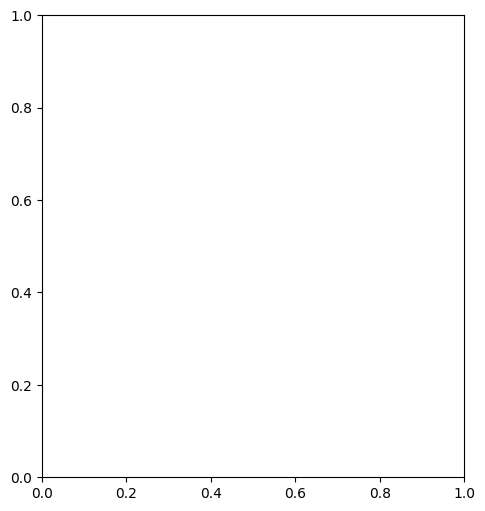

In [12]:
# Какие категории заведений представлены в данных?
# Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.
# Постройте визуализации.
# Ответьте на вопрос о распределении заведений по категориям.


def make_group_table(grop_column: Union[str,list[str]],
                                        agg_column: str,
                                        agg_function: str,
                                        data: pd.DataFrame = data,
                                        sorting_column: str = '%') -> pd.DataFrame:
    """группирует по признаку/признкам"""
    if not isinstance(grop_column, list) and not isinstance(grop_column, str):
        raise TypeError('grop_column must be list or string')
    if not isinstance(agg_column, str):
        raise TypeError('agg_column must be string')
    if not isinstance(agg_function, str):
        raise TypeError('agg_function must be string')
    if not isinstance(data, pd.DataFrame):
        raise TypeError('data must be DataFrame')
    if isinstance(grop_column, list):
        for column in grop_column:
            if not validate(data, column):
                raise ValueError('column does not found')
            else:
                continue
    else:
        for column in [grop_column, agg_column]:
            if not validate(data, column):
                raise ValueError('column does not found')
            else:
                continue
    table: pd.DataFrame = (data
                               .groupby(by=grop_column)
                               .agg({agg_column: agg_function})
                               .reset_index()
                               .rename(columns={agg_column: f'{agg_column}_{agg_function}'}))
    table['%']: pd.Series = round((table[
                                         f'{agg_column}_{agg_function}'
                                        ] / sum(table[
                                                      f'{agg_column}_{agg_function}'
                                                     ])) * 100, 2)
    return table.sort_values(by=sorting_column, ascending=False).reset_index(drop=True)


categories: list[str] = make_group_table('category', 'name', 'nunique')['category'].tolist()
name_nunique:list[int] = make_group_table('category', 'name', 'nunique')['name_nunique'].tolist()
percentages: list[float] = make_group_table('category', 'name', 'nunique')['%'].tolist()


sns.set_palette('pastel')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.barplot(name_nunique, categories, color='mediumpurple', orient='h').set_title('Количество заведений по категориям')


plt.subplot(1, 2, 2)
plt.title('Процентое распределение')
plt.pie(percentages, labels=['']*len(categories), autopct='%1.2f%%')
plt.legend(categories, loc='best', mode=" expand", bbox_to_anchor=(1, 0, 0, 1))
plt.axis('equal')


plt.show();

Из представленных категорий больше всего кафе

2023-06-25 09:34:04,396 - INFO - были исключены пропуски


std - 122.84113002366072
mean - 108.36143572621035
выбросов % -  2.17


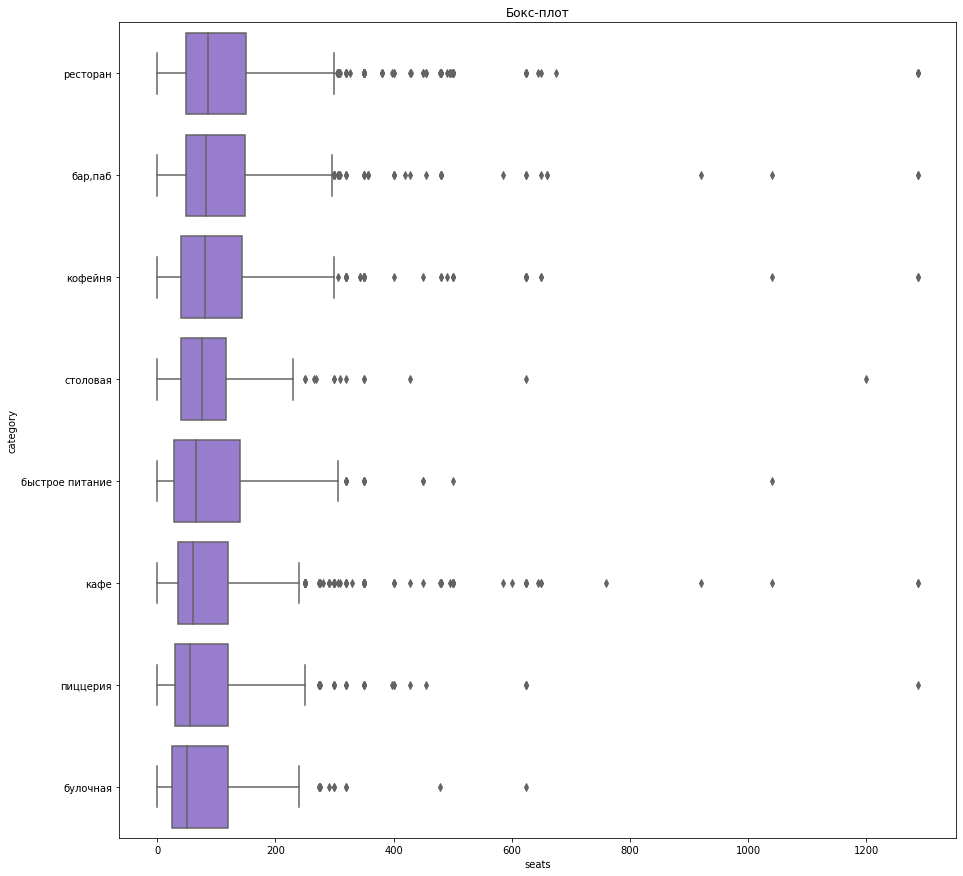

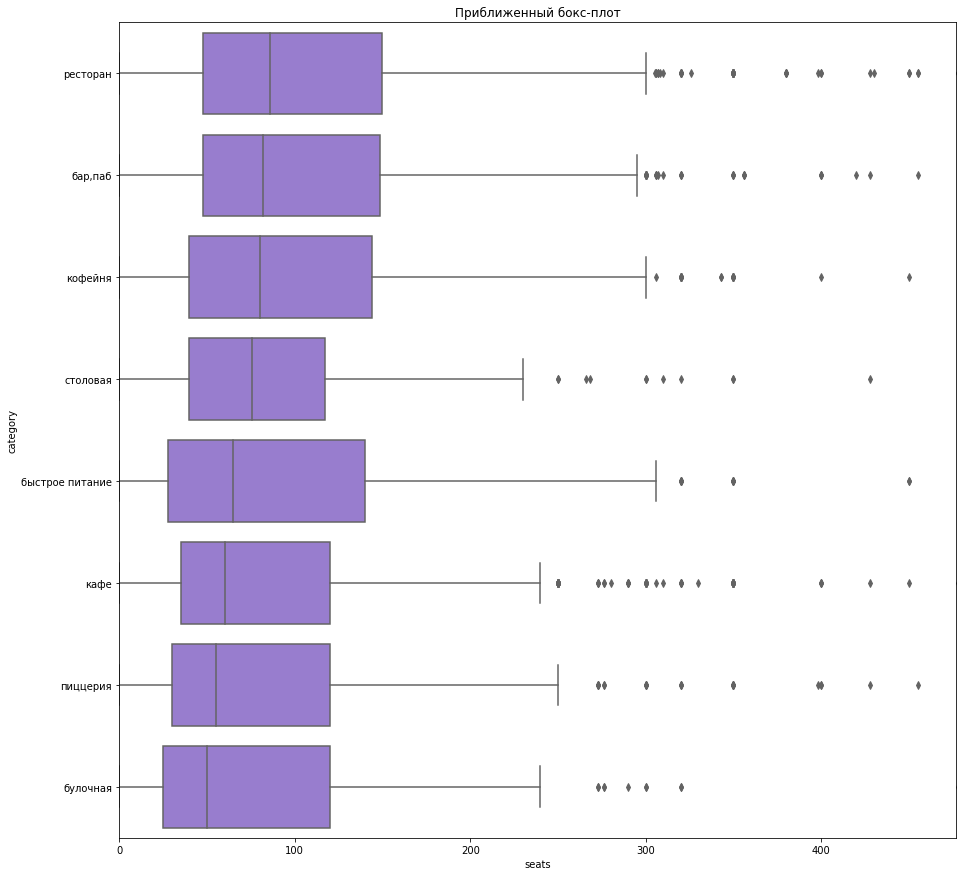

In [ ]:
# Исследуйте количество посадочных мест в местах по категориям
# Постройте визуализации.
# Проанализируйте результаты и сделайте выводы.

make_full_analyses_anomalies(data, 'seats', 'category', {'boxplot': (15, 15),
                                                           'detail_box_plot': (15, 15)})

В среднем больше всего посадочных мест можно встретить в ресторанах, однако можно встретить огромные бары, кафе, кофейни. Меньше всего посадочных мест в булочных, хотя можно часто встретить небольшие рестораны

2023-06-25 09:34:04,998 - INFO - были исключены пропуски


std - 122.84113002366072
mean - 108.36143572621035
выбросов % -  2.17


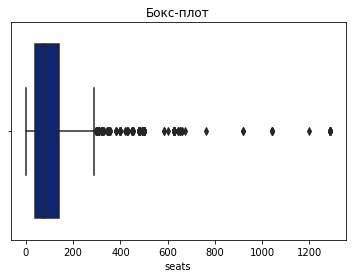

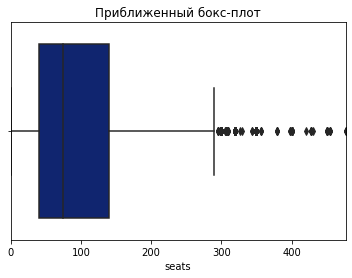

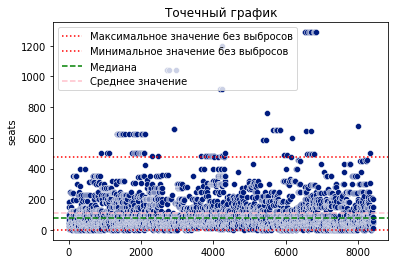

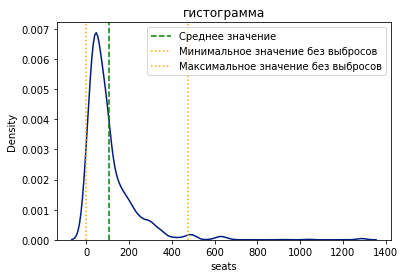

In [ ]:
make_full_analyses_anomalies(data, 'seats')

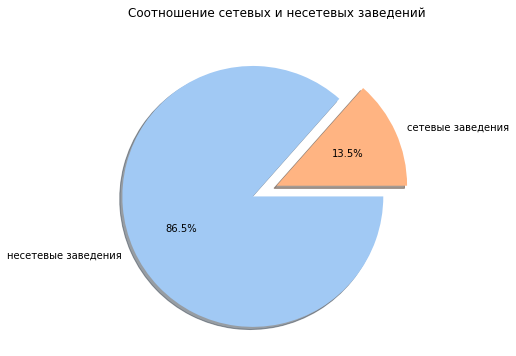

In [ ]:
# Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

df: pd.DataFrame = make_group_table('chain', 'name', 'nunique')


sns.set_palette('pastel')
plt.figure(figsize=(6, 6))
explode: tuple[Union[int, float]] = (0.2, 0)
plt.pie(df['name_nunique'],
        labels=df['chain'].map({True: 'сетевые заведения',
                                False: 'несетевые заведения'}), 
        explode=explode, 
        autopct='%1.1f%%', 
        counterclock=False, 
        shadow=True)
plt.title('Соотношение сетевых и несетевых заведений')
plt.show();

Больщую долю рынка занимают несетевые заведения

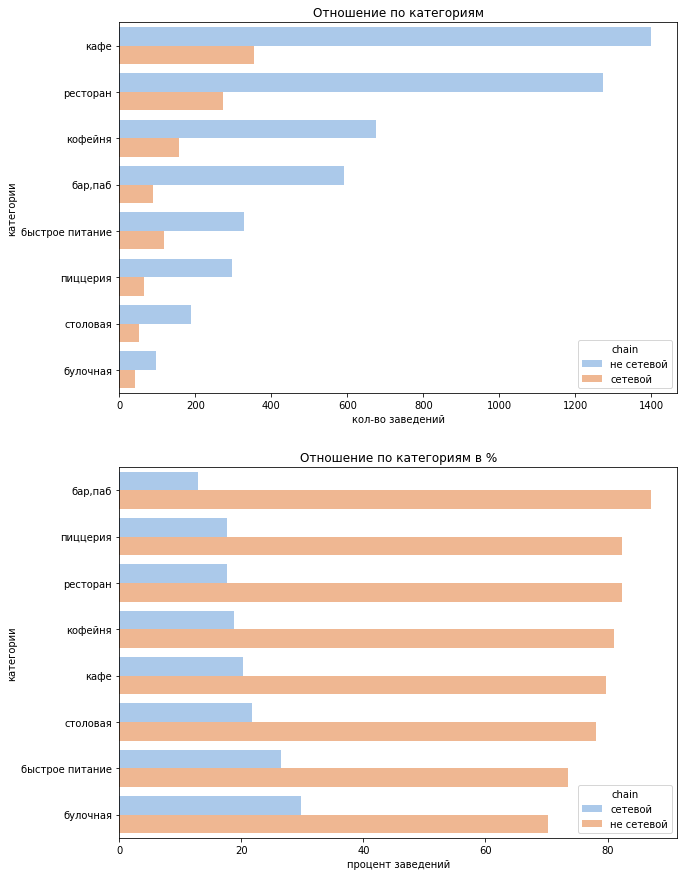

In [ ]:
# Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком


df: pd.DataFrame = make_group_table(['chain', 'category'], 'name', 'nunique')
df['chain']: pd.Series = df['chain'].apply(lambda value: 'сетевой' if value else 'не сетевой')
df['%, category']: pd.Series = df.apply(lambda row: round((row['name_nunique']/sum(df[df['category']==row['category']]['name_nunique']))*100, 2),
                                        axis=1)

plt.figure(figsize=(10, 15))
plt.subplot(2, 1, 1)
sns.barplot(x='name_nunique', y='category', hue='chain', data=df)
plt.title('Отношение по категориям')
plt.ylabel("категории")
plt.xlabel("кол-во заведений")


plt.subplot(2, 1, 2)
sns.barplot(x='%, category', y='category', hue='chain', data=df.sort_values(by='%, category'))
plt.title('Отношение по категориям в %')
plt.ylabel("категории")
plt.xlabel("процент заведений")
plt.show()

Больше всего несетевых заведений - бары, а сетевых - булочных (по отношению к сетевым той же категории)

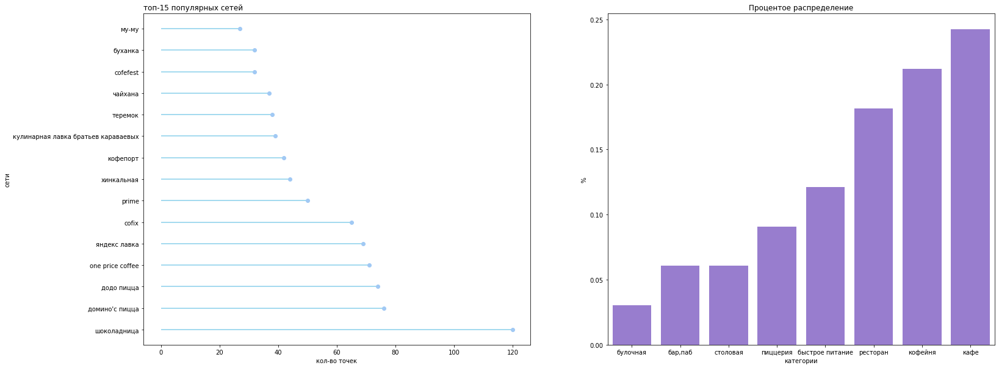

In [ ]:
# Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве.
# Под популярностью понимается количество заведений этой сети в регионе.
# Постройте подходящую для такой информации визуализацию.
# Знакомы ли вам эти сети? 
# Есть ли какой-то признак, который их объединяет?
# К какой категории заведений они относятся?


# первый график
df: pd.DataFrame = make_group_table('name', 'lng', 'count', data[data['chain'] == True])[:15]
my_range: range = range(1,len(df.index)+1)


plt.figure(figsize=(25, 10))
plt.subplot(1, 2, 1)
plt.hlines(y=my_range, xmin=0, xmax=df['lng_count'], color='skyblue')
plt.plot(df['lng_count'], my_range, "o")
plt.yticks(my_range, df['name'])
plt.title("топ-15 популярных сетей", loc='left')
plt.xlabel('кол-во точек')
plt.ylabel('сети')


# второй график
champions: list[str] = df['name'].to_list()
df: pd.DataFrame = data.query('name in @champions').groupby(by='category').agg({'name': 'nunique'}).reset_index()
df['%']: pd.Series = df['name']/sum(df['name'] )


plt.subplot(1, 2, 2)
plt.title('Процентое распределение')
sns.barplot(x='category', y='%', data=df.sort_values(by='%'), color='mediumpurple')
plt.xlabel('категории')



plt.show();

Как видно из графика наиболее популярная сеть - шоколадница, замыкает топ-15 - муму. Наибольшая часть успешных сетей - кафе, меньше всего - булочных

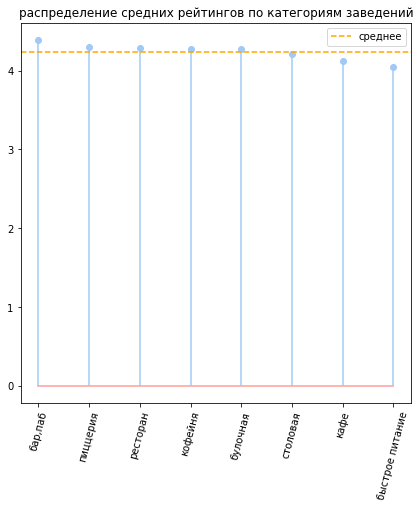

In [ ]:
# Какие административные районы Москвы присутствуют в датасете?
# Отобразите общее количество заведений и количество заведений каждой категории по районам.
# Попробуйте проиллюстрировать эту информацию одним графиком.


def make_treemap_per_two_factors(factor_1: str, factor_2: str, agg_column: str, agg_function: str, data: pd.DataFrame = data) -> None:
    """отрисовывает treemap графики по сгруппированным данным"""
    table: pd.DataFrame = make_group_table([factor_1, factor_2], agg_column, agg_function)
    plt.figure(figsize=(15, 15))
    plt.title('общее количество заведений и количество заведений каждой категории по районам')
    for index, factor_1_value in enumerate(data[factor_1].unique()):
        sup_table: pd.DataFrame = table[table[factor_1] == factor_1_value]
        plt.subplot((len(data[factor_1].unique())+1)//2, 2, index+1)
        squarify.plot(sizes=sup_table[f'{agg_column}_{agg_function}'], label=sup_table[factor_2], alpha=.8 )
        plt.title(f"{factor_1_value} - {sum(sup_table[f'{agg_column}_{agg_function}'])}")
        plt.axis('off')
    plt.show();

def make_bar_plus(factor_1: str, factor_2: str, agg_column: str, agg_function: str, title_text: Optional[str] = None, data: pd.DataFrame = data, sorting_column: Optional[str] = '%') -> None:
    """отрисовывает treemap графики по сгруппированным данным"""
    # не забыть удалить после ревью !
    names_to_russians_for_rev = {'district': 'округа',
                                 'category': 'категории',
                                 'street': 'улицы'}
    table: pd.DataFrame = make_group_table([factor_1, factor_2], agg_column, agg_function, data, sorting_column)
    fig = px.bar(table, x=factor_1, y=f'{agg_column}_{agg_function}', color=factor_2, labels={factor_1: names_to_russians_for_rev[factor_1],
                                                                                              f'{agg_column}_{agg_function}':'количество точек'})
    fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total ascending'}, title_text=title_text)
    fig.show()


make_bar_plus('district', 'category', 'name', 'nunique', title_text='общее количество заведений и количество заведений каждой категории по районам', sorting_column='name_nunique')


# Визуализируйте распределение средних рейтингов по категориям заведений.
# Сильно ли различаются усреднённые рейтинги в разных типах общепита?


df: pd.DataFrame = make_group_table(['category'], 'rating', 'mean')
my_range: range = range(len(df.index))

sns.set_palette('pastel')
plt.figure(figsize=(7, 7))
plt.title('распределение средних рейтингов по категориям заведений')
plt.stem(df['rating_mean'])
plt.xticks(my_range, df['category'], rotation=75)
plt.axhline(y=df['rating_mean'].mean(), linestyle='--', color='orange', label='среднее')
plt.legend()
plt.show()

Больше всего заведений в центральном административном округе - в нем больше всего ресторанов.
Средний рейтинг варьируется, но его колебания незначительны.

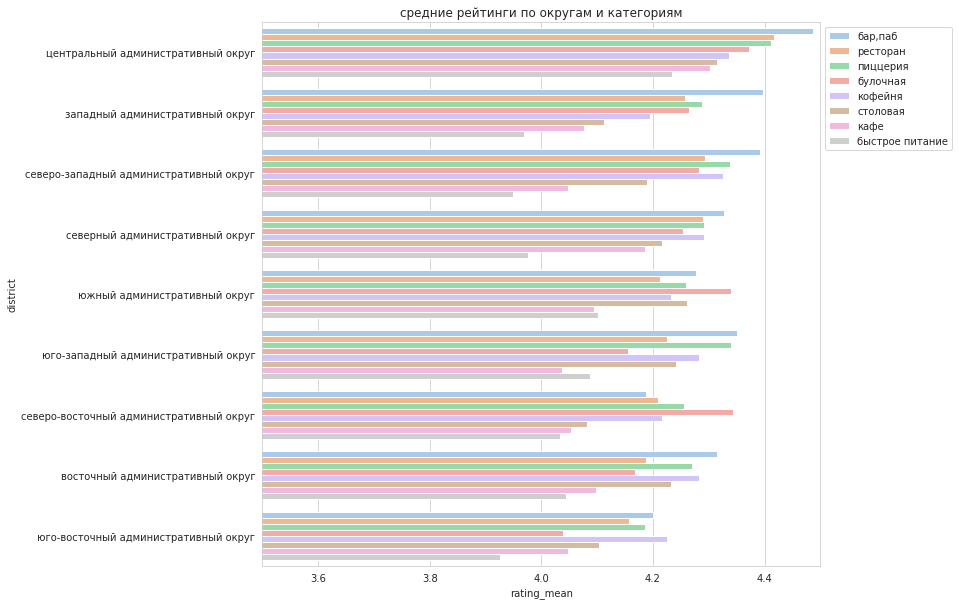

In [ ]:
# Визуализируйте распределение средних рейтингов по категориям заведений.
# Сильно ли различаются усреднённые рейтинги в разных типах общепита?


df: pd.DataFrame = make_group_table(['district', 'category'], 'rating', 'mean')


sns.set_style('whitegrid')
plt.figure(figsize=(10, 10))
sns.barplot(y='district', x='rating_mean', hue='category', data=df)
plt.xlim(3.5, 4.5)
plt.title('средние рейтинги по округам и категориям')
plt.legend(loc='best', mode=" expand", bbox_to_anchor=(1, 0, 0, 1))
plt.show();

In [ ]:
# Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
# Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).


data['district']: pd.Series = data['district'].apply(lambda district: ' '.join([district.split()[0].title(), district.split()[1], district.split()[2]]))
rating_df: pd.DataFrame = data.groupby('district', as_index=False)['rating'].agg('median')
state_geo: str = '/datasets/admin_level_geomap.geojson'


def make_horoplet(geo_colomn: str, factor_colomn: str, data: pd.DataFrame, title:str, state_geo='/datasets/admin_level_geomap.geojson') -> Map:
    for arg in [geo_colomn, factor_colomn, title, state_geo]:
        if not isinstance(arg, str):
            raise TypeError('must be string')
    if not isinstance(data, pd.DataFrame):
        raise TypeError('must be Frame')
    for column in [geo_colomn, factor_colomn]:
        if not validate(data, column):
            raise ValueError('column does not found')
    moscow_lat, moscow_lng = 55.751244, 37.618423
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    Choropleth(
        geo_data=state_geo,
        data=data,
        columns=[geo_colomn, factor_colomn],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title,
    ).add_to(m)
    return m


make_horoplet('district', 'rating', rating_df, 'Медианный рейтинг заведений по районам')

Из графика видно, что заведения с самым большим рейтингом сосредоточенны ы центре, а на Северо-Востоке и на Юго-Востоке рейтинг хромает

In [ ]:
# Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

def make_clasters_on_map(data: pd.DataFrame):
    if not isinstance(data, pd.DataFrame):
        raise TypeError('must be string')
    moscow_lat, moscow_lng = 55.751244, 37.618423
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    marker_cluster = MarkerCluster().add_to(m)


    def create_clusters(row):
        icon_url = 'https://icons8.com/icon/46588/hamburger'  
        # создаём объект с собственной иконкой размером 30x30
        icon = CustomIcon(icon_url, icon_size=(30, 30))
        Marker(
            [row['lat'], row['lng']],
            popup=f"{row['name']} {row['rating']}",
        ).add_to(marker_cluster)


    data.apply(create_clusters, axis=1)
    return m

make_clasters_on_map(data)

График показывает что в принципе заведений общественного питания больше в центральной части города.

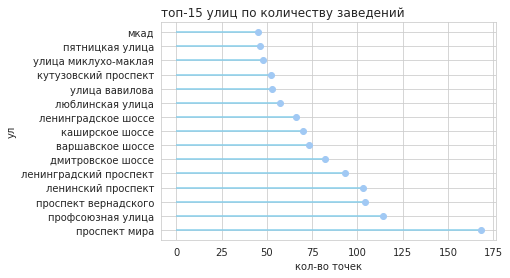

In [ ]:
# Найдите топ-15 улиц по количеству заведений.
# Постройте график распределения количества заведений и их категорий по этим улицам.
# Попробуйте проиллюстрировать эту информацию одним графиком.


df: pd.DataFrame = make_group_table('street', 'name', 'nunique', data.query('street != "ошибка заполнения адреса"'))[:15]
my_range: range = range(1,len(df.index)+1)
champions = df["street"].tolist()

plt.hlines(y=my_range, xmin=0, xmax=df['name_nunique'], color='skyblue')
plt.plot(df['name_nunique'], my_range, "o")
plt.yticks(my_range, df['street'])
plt.title("топ-15 улиц по количеству заведений", loc='left')
plt.xlabel('кол-во точек')
plt.ylabel('ул')
plt.show()


make_bar_plus('street', 'category', 'name', 'nunique', 'график распределения количества заведений и их категорий по этим улицам', data.query('street in @champions'), 'name_nunique')

Абсолютный лидер по кол-ву точек общественного питания - проспект мира (169) - самая большая доля у кафе и ресторанов, а замыкает список лидеров - мкад (49) - больше всего кафе.

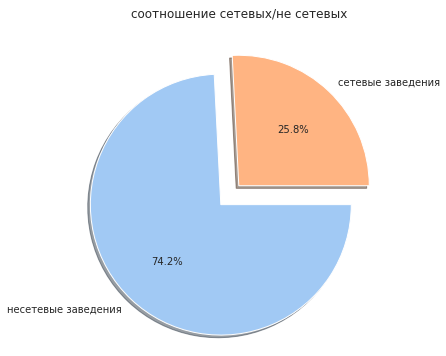

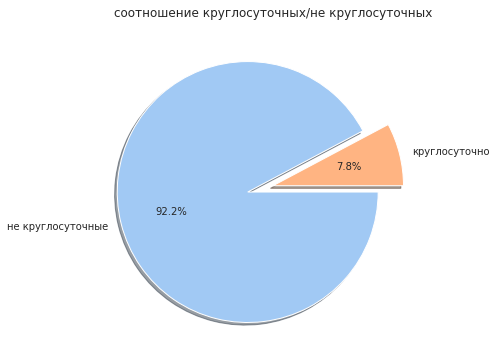

2023-06-25 09:34:20,566 - INFO - seats
2023-06-25 09:34:20,569 - INFO - были исключены пропуски


std - 48.212643178570396
mean - 58.1375
выбросов % -  2.5


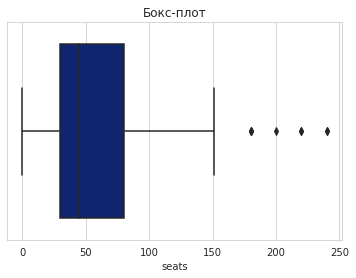

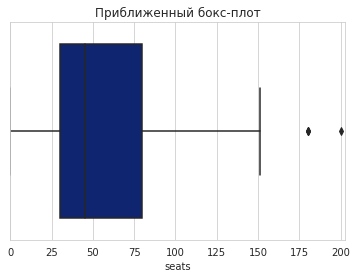

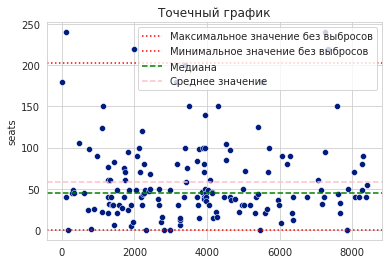

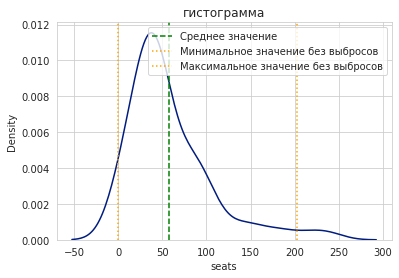

2023-06-25 09:34:21,598 - INFO - rating


iqr - 0.40000000000000036
q75 - 4.5
q25 - 4.1
выбросов % -  5.43


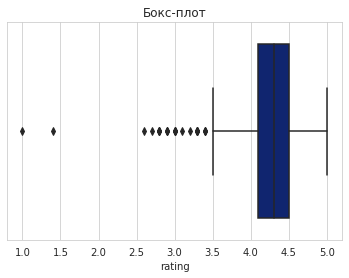

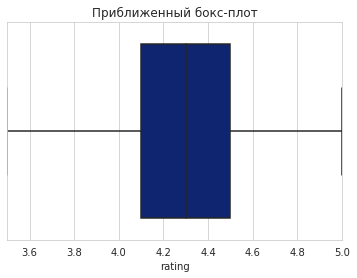

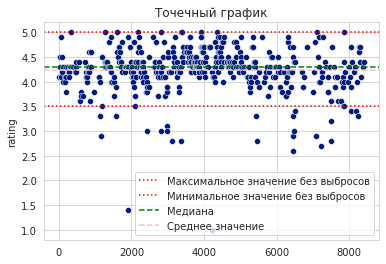

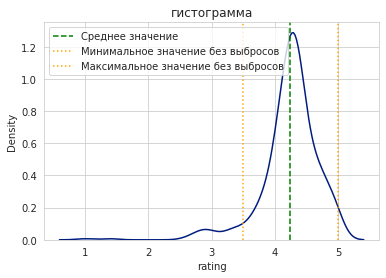

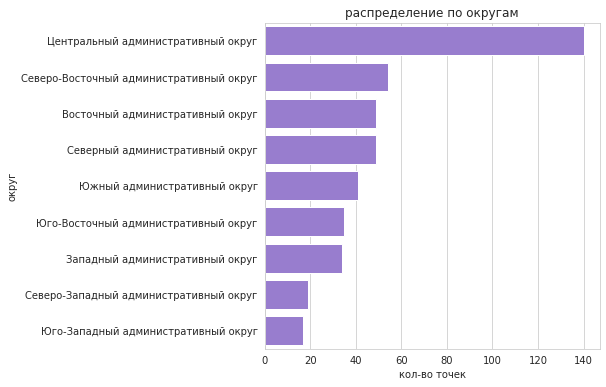

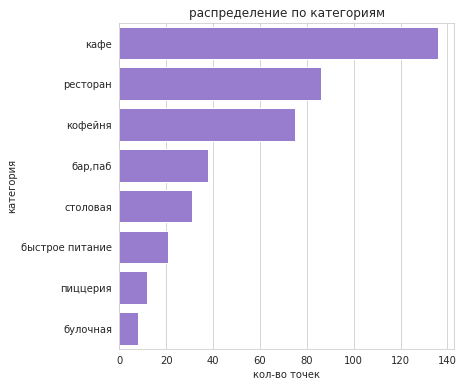

In [ ]:
# Найдите улицы, на которых находится только один объект общепита.
# Что можно сказать об этих заведениях?


looser_streets: list =( make_group_table('street',
                                  'name',
                                  'nunique',
                                  data.query('street != "ошибка заполнения адреса"')
                                 ).query('name_nunique == 1')['street'].to_list())
df: pd.DataFrame = data.query('street in @looser_streets')


def make_pieplot(group_column: str,
                 agg_column: str,
                 agg_function: str,
                 params: dict[bool: str],
                 title: str,
                 data: pd.DataFrame = data) -> None:
    sns.set_palette('pastel')
    plt.figure(figsize=(6, 6))
    explode: tuple[Union[int, float]] = (0.2, 0)
    df: pd.DataFrame = make_group_table(group_column, agg_column, agg_function, data)
    plt.pie(df[f'{agg_column}_{agg_function}'],
            labels=df[group_column].map(params), 
            explode=explode, 
            autopct='%1.1f%%', 
            counterclock=False, 
            shadow=True)
    plt.title(title)
    plt.show();


def make_barplot(group_column: str,
                 agg_column: str,
                 agg_function: str,
                 params: dict[str: str],
                 data: pd.DataFrame = data) -> None:
    plt.figure(figsize=(6, 6))
    sns.barplot(x=f'{agg_column}_{agg_function}', y=group_column, data=make_group_table(group_column, agg_column, agg_function, data), color='mediumpurple')
    plt.title(params['title'])
    plt.ylabel(params['ylab'])
    plt.xlabel(params['xlab'])
    plt.show();

def make_fast_analis(data: pd.DataFrame) -> None:
    for column, params, title in zip(['chain', 'is_24/7'], [{True: 'сетевые заведения',
                                                   False: 'несетевые заведения'},
                                                 {True: 'круглосуточно',
                                                  False: 'не круглосуточные'}],
                                     ["соотношение сетевых/не сетевых",
                                      "соотношение круглосуточных/не круглосуточных"]):
        make_pieplot(column, 'name', 'nunique', params, title, data)


    for column in ['seats', 'rating']:
        logging.info(column)
        make_full_analyses_anomalies(data, column)


    for column, params in zip(['district', 'category'], [{'title': 'распределение по округам',
                                             'ylab': 'округ',
                                             'xlab': 'кол-во точек'},
                                             {'title': 'распределение по категориям',
                                              'ylab': 'категория',
                                              'xlab': 'кол-во точек'}]):
        make_barplot(column, 'name', 'nunique', params, data)

make_fast_analis(df)

Единственные заведения на улице - кафе, большей частью не сетевые, не круглосуточные и не ежедневные, с медианным количеством мест от 60 до 70 с медианным рейтингом - 4.3, в Центральном фдминистративном округе.

2023-06-25 09:34:23,083 - INFO - были исключены пропуски


std - 1009.7328445612162
mean - 958.0536678310575
выбросов % -  0.95


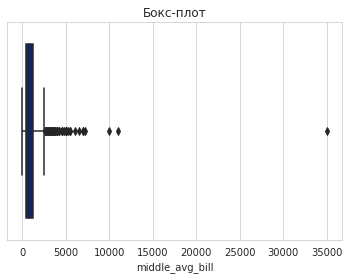

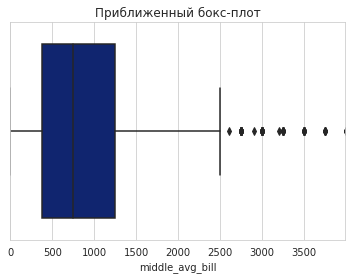

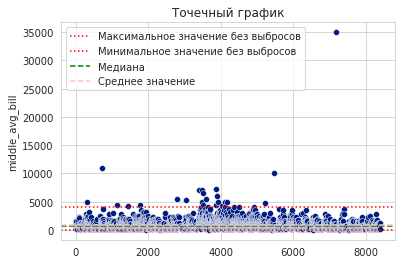

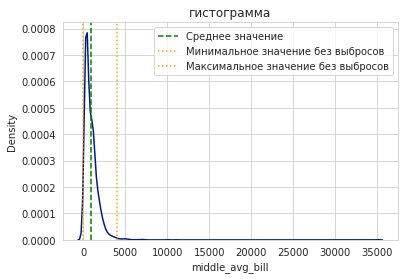

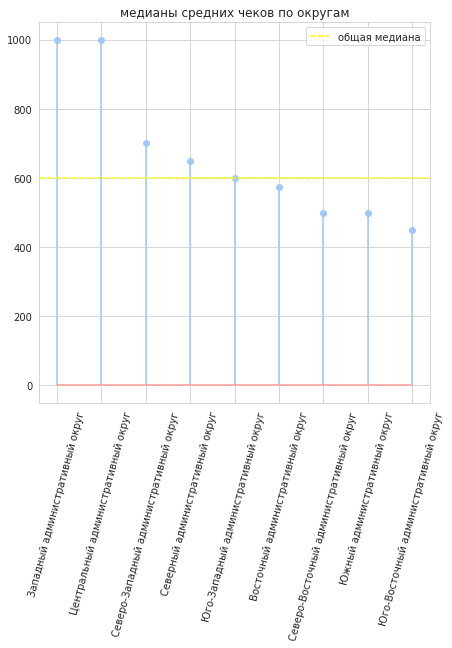

In [ ]:
# Значения средних чеков заведений хранятся в столбце middle_avg_bill.
# Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном.
# Посчитайте медиану этого столбца для каждого района.
# Используйте это значение в качестве ценового индикатора района.
# Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района.
# Проанализируйте цены в центральном административном округе и других.
# Как удалённость от центра влияет на цены в заведениях?


make_full_analyses_anomalies(data, 'middle_avg_bill')


df = make_group_table('district', 'middle_avg_bill', 'median')
my_range = range(len(df.index))


sns.set_palette('pastel')
plt.figure(figsize=(7, 7))
plt.title('медианы средних чеков по округам')
plt.stem(df['middle_avg_bill_median'])
plt.xticks(my_range, df['district'], rotation=75)
plt.axhline(y=df['middle_avg_bill_median'].median(), linestyle='--', color='yellow', label='общая медиана')
plt.legend()
plt.show();

make_horoplet('district',
              'middle_avg_bill',
              data.groupby('district', as_index=False)['middle_avg_bill'].agg('median'),
              'Медианный средний чек заведений по районам')


Выше всего цены в Центральном округе - что, представляеться весьма логичным из-за больших издержек на аренду и содержания помещения. В восточных округах цены меньше чем в западных.

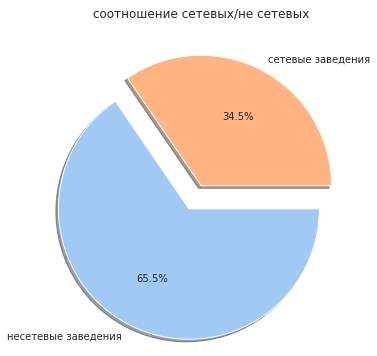

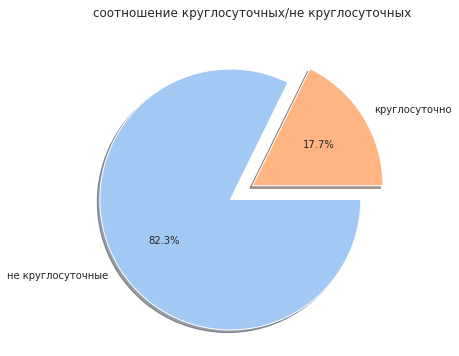

2023-06-25 09:34:24,916 - INFO - seats
2023-06-25 09:34:24,919 - INFO - были исключены пропуски


std - 85.8387134236192
mean - 84.96875
выбросов % -  1.56


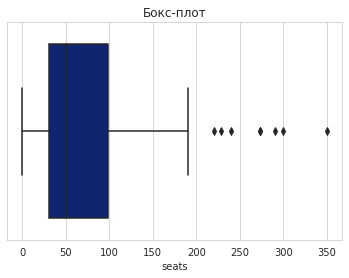

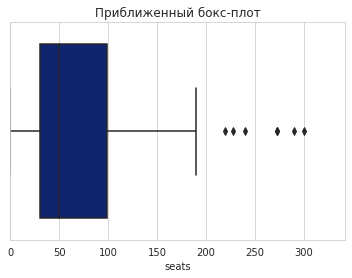

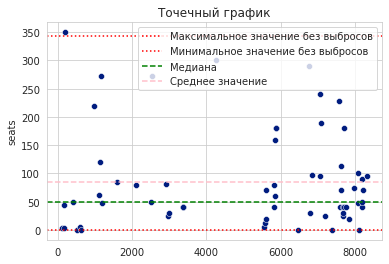

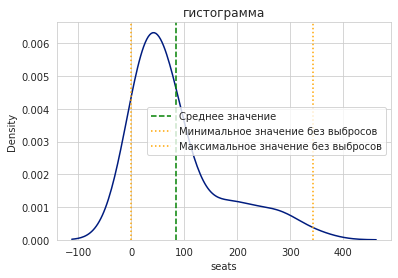

2023-06-25 09:34:25,996 - INFO - rating


iqr - 0.9999999999999998
q75 - 2.3
q25 - 1.3
выбросов % -  0.0


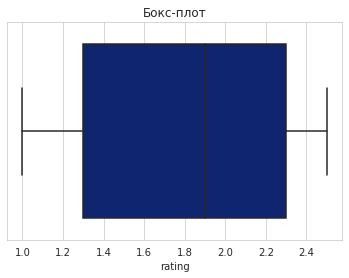

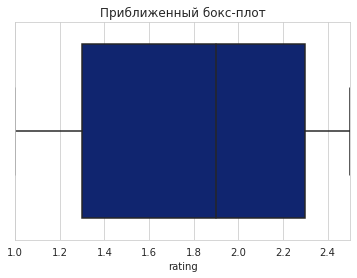

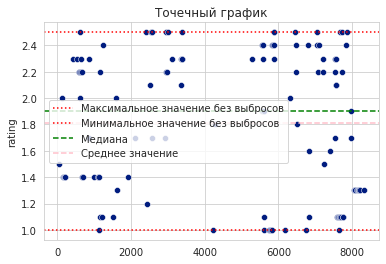

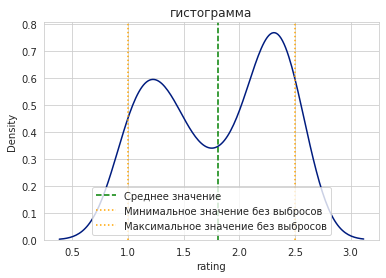

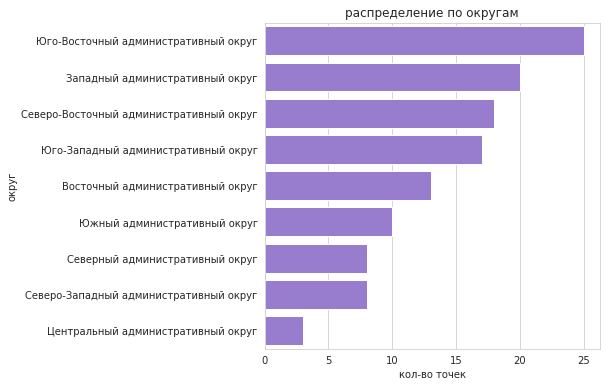

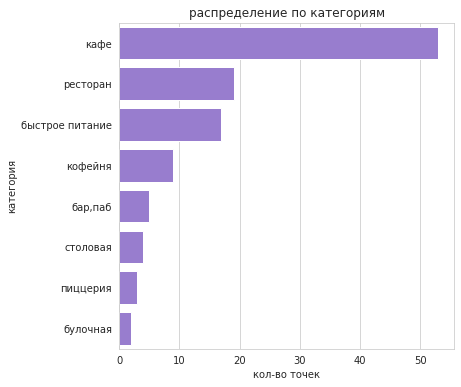

In [ ]:
# Также можно исследовать особенности заведений с плохими рейтингами,
# средние чеки в таких местах и распределение по категориям заведений.

make_fast_analis(data.query('rating <= 2.5'))

2023-06-25 09:34:27,525 - INFO - были исключены пропуски


                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     109.3
Date:                Sun, 25 Jun 2023   Prob (F-statistic):           3.53e-25
Time:                        09:34:27   Log-Likelihood:                -851.79
No. Observations:                3149   AIC:                             1708.
Df Residuals:                    3147   BIC:                             1720.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               4.2358      0.008    5

<Figure size 720x432 with 0 Axes>

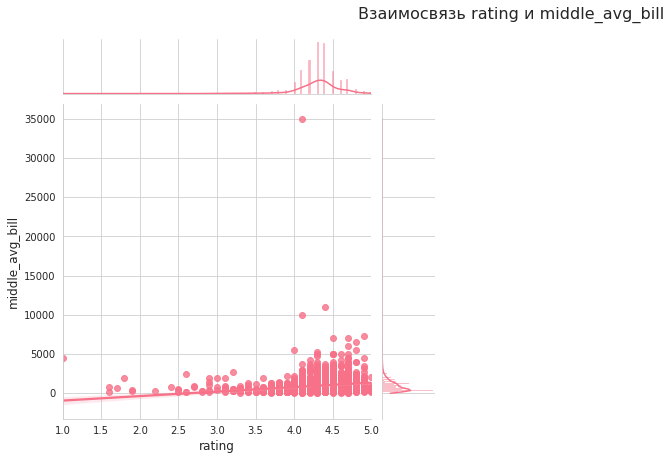

2023-06-25 09:34:29,415 - INFO - были исключены пропуски


                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.135
Date:                Sun, 25 Jun 2023   Prob (F-statistic):              0.144
Time:                        09:34:29   Log-Likelihood:                -2942.8
No. Observations:                4792   AIC:                             5890.
Df Residuals:                    4790   BIC:                             5902.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.2333      0.009    491.332      0.0

<Figure size 720x432 with 0 Axes>

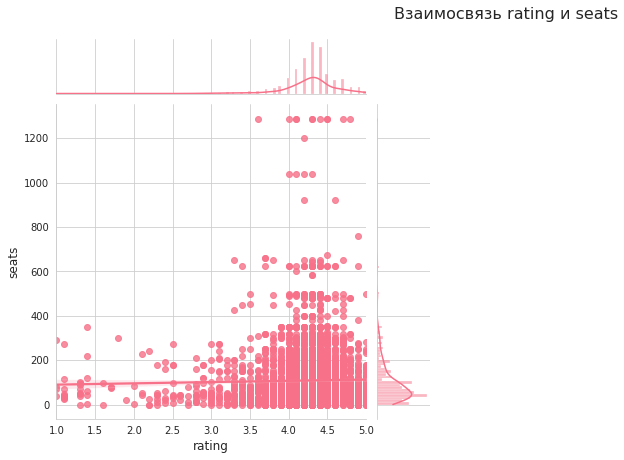

2023-06-25 09:34:30,909 - INFO - были исключены пропуски


                            OLS Regression Results                            
Dep. Variable:        middle_avg_bill   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     109.3
Date:                Sun, 25 Jun 2023   Prob (F-statistic):           3.53e-25
Time:                        09:34:30   Log-Likelihood:                -26197.
No. Observations:                3149   AIC:                         5.240e+04
Df Residuals:                    3147   BIC:                         5.241e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1503.1559    236.043     -6.368      0.0

<Figure size 720x432 with 0 Axes>

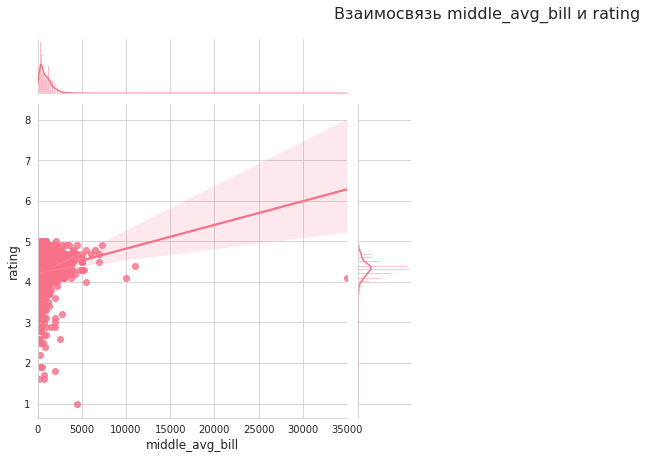

2023-06-25 09:34:32,306 - INFO - были исключены пропуски
2023-06-25 09:34:32,309 - INFO - были исключены пропуски


                            OLS Regression Results                            
Dep. Variable:        middle_avg_bill   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     13.60
Date:                Sun, 25 Jun 2023   Prob (F-statistic):           0.000232
Time:                        09:34:32   Log-Likelihood:                -16798.
No. Observations:                1990   AIC:                         3.360e+04
Df Residuals:                    1988   BIC:                         3.361e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        900.5791     34.821     25.863      0.0

<Figure size 720x432 with 0 Axes>

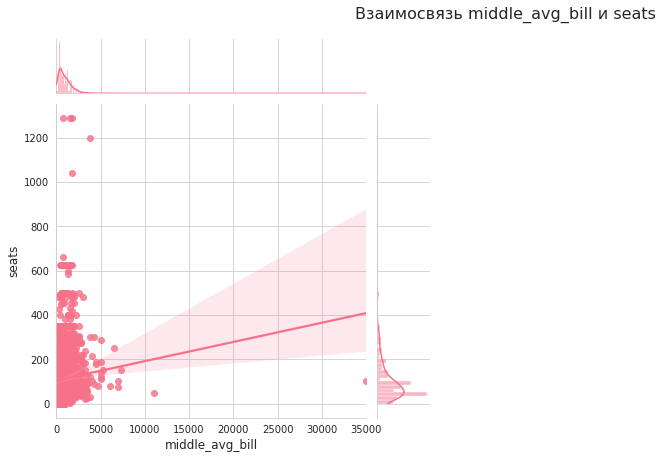

2023-06-25 09:34:33,591 - INFO - были исключены пропуски


                            OLS Regression Results                            
Dep. Variable:                  seats   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.135
Date:                Sun, 25 Jun 2023   Prob (F-statistic):              0.144
Time:                        09:34:33   Log-Likelihood:                -29852.
No. Observations:                4792   AIC:                         5.971e+04
Df Residuals:                    4790   BIC:                         5.972e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         83.7731     16.920      4.951      0.0

<Figure size 720x432 with 0 Axes>

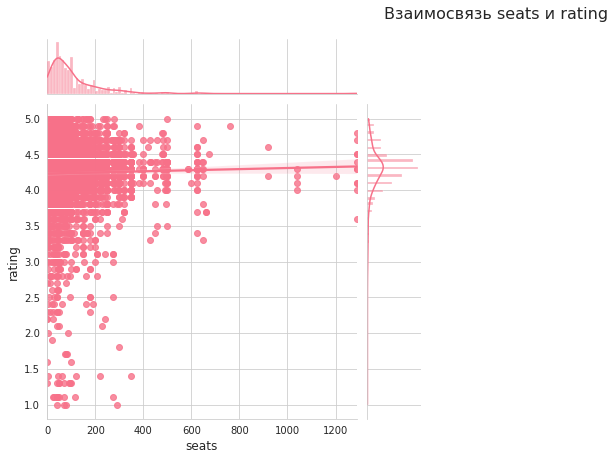

2023-06-25 09:34:35,473 - INFO - были исключены пропуски
2023-06-25 09:34:35,476 - INFO - были исключены пропуски


                            OLS Regression Results                            
Dep. Variable:                  seats   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     13.60
Date:                Sun, 25 Jun 2023   Prob (F-statistic):           0.000232
Time:                        09:34:35   Log-Likelihood:                -12317.
No. Observations:                1990   AIC:                         2.464e+04
Df Residuals:                    1988   BIC:                         2.465e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             104.7955      3.524     

<Figure size 720x432 with 0 Axes>

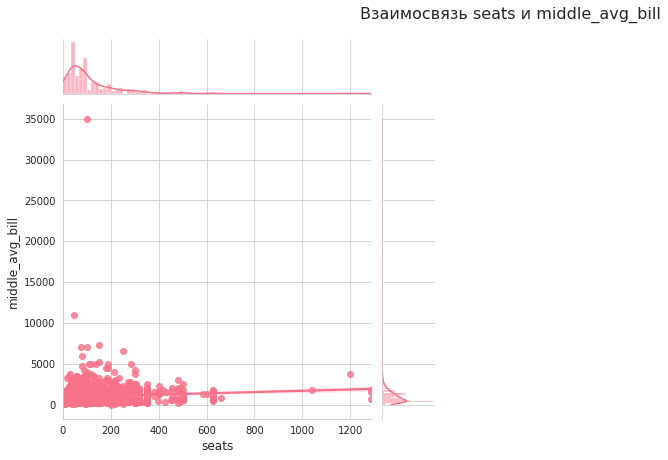

In [ ]:
class Regressor:
    """Класс линейной регрессии""" 
 
    def __init__(self, data, predictor, target, text): 
        self.data = data 
        self.predictor = predictor 
        self.target = target 
        self.text = text
        if self.data[self.predictor].isna().sum() > 0:
            self.data = self.data[self.data[self.predictor].notna()]
            logging.info('были исключены пропуски')
        if self.data[self.target].isna().sum() > 0:
            self.data = self.data[self.data[self.target].notna()]
            logging.info('были исключены пропуски')
 
    def analysis(self): 
        if self.predictor in self.data.columns and self.target in self.data.columns: 
            regression = sm.OLS(self.data[self.predictor], sm.add_constant(self.data[self.target])) 
            result = regression.fit() 
            return {
                'params': result.params,
                'bse': result.bse,
                'pvalues': result.pvalues,
                't_test_const': result.t_test([1,0]),
                't_test_regr': result.t_test([0,1]),
                'f_test': result.f_test(np.identity(2)),
                'summary': result.summary()
            }
        else:
            raise ValueError('Столбцы predictor и/или target не найдены в датафрейме')
 
    def visualisation(self, savefig=None): 
        if self.predictor in self.data.columns and self.target in self.data.columns:
            sns.set_style("whitegrid") 
            sns.set_palette("husl") 
            plt.figure(figsize=(10, 6)) 
            plot = sns.jointplot(x=self.predictor, y=self.target, data=self.data, kind='reg') 
            plot.fig.suptitle(self.text[0], x=1.15, y=1.05, fontsize=16) 
            plot.set_axis_labels(self.text[1], self.text[2], fontsize=12) 
            if savefig is not None:
                plt.savefig(savefig)
            plt.show()
        else:
            raise ValueError('Столбцы predictor и/или target не найдены в датафрейме')


list_column_reg: list = ['rating', 'middle_avg_bill', 'seats']


for column in list_column_reg:
    for column_ in list_column_reg:
        if column != column_:
            reg: Regressor = Regressor(data, column, column_, [f'Взаимосвязь {column} и {column_}', column, column_])
            analysis_results = reg.analysis()
            print(analysis_results['summary'])
            reg.visualisation()
        else:
            continue

Коэффициент детерминации весьма незначителен, поэтому линейной всязи между данными обнаружено не было, но попробовать стоило.

In [ ]:
def make_3d(color: str) -> None:
    if not validate(data, color):
        raise ValueError('not found')
    if not isinstance(color, str):
        raise TypeError('color must be string')
    fig = px.scatter_3d(data[(data['seats'].notna())&(data['rating'].notna())&(data[color].notna())],
                    x = 'middle_avg_bill', 
                    y = 'seats', 
                    z = 'rating', 
                    color = color) 
    fig.show()


for column in ['chain', 'is_24/7']:
    make_3d(column)

#### Шаг 4. Детализируем исследование: открытие кофейни

In [ ]:
# Ответьте на следующие вопросы:
# Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

make_clasters_on_map(data.query('category == "кофейня"'))

Распределение кофеен по городу укладывается в общую тенденцию - наибольшее количество сосредоточено в центре.

In [ ]:
# Есть ли круглосуточные кофейни?

make_clasters_on_map(data[(data['category']=='кофейня')&(data['is_24/7'] == True)])

После фильтрации на карте обозначены кластеры кофеен которые работают круглосуточно и ежедневно, как видно по карте конкуренция будет минимально в этой нише, основные конкуренты обосновались в центре.

In [ ]:
# Какие у кофеен рейтинги? Как они распределяются по районам?

make_horoplet('district',
              'rating',
              data.query('category == "кофейня"').groupby('district', as_index=False)['rating'].agg('mean'),
              'Медианный рейтинг заведений по районам')

Рейтинги довольно высокие по всему городу, самые большие в центре и Северо-Западе, самые низкиев районе Юго-Запада И Северо-Востока. Здесь конкурентов будет особенно легко обойти у увести целевую аудиторию

In [ ]:
# На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

make_horoplet('district',
              'middle_avg_bill',
              data.query('category == "кофейня"').groupby('district', as_index=False)['middle_avg_bill'].agg('median'),
              'Медианный средний чек заведений по районам')

Самый высокий медианный средний чек на Юго-Западе (может поэтому там самый низкий рейтинг), а самый низкий - Юго-Востоке

####  Выводы

Итоговые рекомендации:
- Лучше всего открыть кафе в центральной части города, так как здесь наибольшее количество заведений общественного питания и наибольшая доля успешных сетей.
- Стоит обратить внимание на категории кафе и рестораны, так как они имеют наибольшую долю на рынке и больше всего посадочных мест.
- Следует учитывать, что на Юго-Западе города наибольший средний чек, но и самый низкий рейтинг, поэтому можно попытаться привлечь целевую аудиторию с помощью более высокого качества продукции или уникальной концепции заведения.
- Также можно рассмотреть возможность открытия кофейни, которая работает круглосуточно и ежедневно, так как в этой нише конкуренция минимальна, основные конкуренты обосновались в центре.

[Презентация](https://1drv.ms/p/s!Aggbsa1X4Swy6ST5EmAwiVGZOC1p?e=kzTzgR)
